# Load necessary packages

In [1]:
import os
import pprint

from cmcrameri import cm as cm_ref
import matplotlib.pyplot as plt
import nrrd
import numpy as np
import pydicom
from scipy import stats
from sklearn.covariance import EllipticEnvelope
from sklearn.inspection import DecisionBoundaryDisplay
import slicerio

import sigclust as sigclust

# Define all file paths

In [2]:
DATA_PATH = 'data_anonymized'

# Get the reference values

In [3]:
REFERENCE_VALS = {
    'T1': {
        '1.5T_manual_updated': [
            22,
            31,
            44,
            62,
            88,
            124,
            179,
            246,
            346,
            487,
            685,
            962,
            1270,
            1741
        ],
        # 20C
        '3T_manual_updated': [
            21.4,
            30.4,
            42.9,
            60.2,
            85.8,
            121.1,
            174.9,
            240.9,
            341.6,
            485,
            690.1,
            987.3,
            1330.2,
            1884
        ]
    },
    'T2': {
        # T2-1 and T2-5 of your (SN130-0043-130-0132) solutions should not be used for reference data or research purposes.
        # Please contact CaliberMRI directly with any questions at support@qmri.com
        '1.5T_manual_updated': [
            7,
            10,
            15,
            21,
            27,
            41,
            62,
            88,
            123,
            np.nan,
            237,
            355,
            493,
            np.nan
        ],
        # 20C
        '3T_manual_updated': [
            5.1,
            7.3,
            10.5,
            14.7,
            19.4,
            29.9,
            44.2,
            63.4,
            88.9,
            np.nan,
            175.1,
            267.3,
            379.5,
            np.nan
        ]
    },
    'PD': {
        '1.5T_manual_updated': [
            5,
            10,
            15,
            20,
            25,
            30,
            35,
            40,
            50,
            60,
            70,
            80,
            90,
            100
        ],
        '3T_manual_updated': [
            5,
            10,
            15,
            20,
            25,
            30,
            35,
            40,
            50,
            60,
            70,
            80,
            90,
            100
        ]
    }
}


# Define the ranges in the reference

In [4]:
CMAPS = {
    'T1': cm_ref.lipari,
    'T2': cm_ref.navia,
    'PD': cm_ref.glasgow
}

UNIT_TYPES = {
    'T1': 'ms',
    'T2': 'ms',
    'PD': 'pu'
}

MIN_RANGE = {
    'T1': 250,
    'T2': 10,
    'PD': 0
}
MAX_RANGE = {
    'T1': 4300,
    'T2': 2000,
    'PD': 160
}
MIN_RANGE_CLINICAL = {
    'T1': 250,
    'T2': 30,
    'PD': 20
}
MAX_RANGE_CLINICAL = {
    'T1': 2000,
    'T2': 200,
    'PD': 160
}

RANGES = {
    'T1': {
        k:  np.where(
                (np.array(REFERENCE_VALS['T1'][k]) >= MIN_RANGE['T1']) &
                (np.array(REFERENCE_VALS['T1'][k]) <= MAX_RANGE['T1'])
            )[0].tolist() for k in REFERENCE_VALS['T1'].keys()
    },
    'T2': {
        k:  np.where(
                (np.array(REFERENCE_VALS['T2'][k]) >= MIN_RANGE['T2']) &
                (np.array(REFERENCE_VALS['T2'][k]) <= MAX_RANGE['T2'])
            )[0].tolist() for k in REFERENCE_VALS['T2'].keys()
    },
    'PD': {
        k:  np.where(
                (np.array(REFERENCE_VALS['PD'][k]) >= MIN_RANGE['PD']) &
                (np.array(REFERENCE_VALS['PD'][k]) <= MAX_RANGE['PD'])
            )[0].tolist() for k in REFERENCE_VALS['PD'].keys()        
    }
}

# TODO: remove un-recommended vials
RANGES_CLINICAL = {
    'T1': {
        k:  np.where(
                (np.array(REFERENCE_VALS['T1'][k]) >= MIN_RANGE_CLINICAL['T1']) &
                (np.array(REFERENCE_VALS['T1'][k]) <= MAX_RANGE_CLINICAL['T1'])
            )[0].tolist() for k in REFERENCE_VALS['T1'].keys()
    },
    'T2': {
        k:  np.where(
                (np.array(REFERENCE_VALS['T2'][k]) >= MIN_RANGE_CLINICAL['T2']) &
                (np.array(REFERENCE_VALS['T2'][k]) <= MAX_RANGE_CLINICAL['T2'])
            )[0].tolist() for k in REFERENCE_VALS['T2'].keys()
    },
    'PD': {
        k:  np.where(
                (np.array(REFERENCE_VALS['PD'][k]) >= MIN_RANGE_CLINICAL['PD']) &
                (np.array(REFERENCE_VALS['PD'][k]) <= MAX_RANGE_CLINICAL['PD'])
            )[0].tolist() for k in REFERENCE_VALS['PD'].keys()        
    }
}

pprint.pprint(RANGES)
pprint.pprint(RANGES_CLINICAL)

{'PD': {'1.5T_manual_updated': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13],
        '3T_manual_updated': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]},
 'T1': {'1.5T_manual_updated': [8, 9, 10, 11, 12, 13],
        '3T_manual_updated': [8, 9, 10, 11, 12, 13]},
 'T2': {'1.5T_manual_updated': [1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12],
        '3T_manual_updated': [2, 3, 4, 5, 6, 7, 8, 10, 11, 12]}}
{'PD': {'1.5T_manual_updated': [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13],
        '3T_manual_updated': [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]},
 'T1': {'1.5T_manual_updated': [8, 9, 10, 11, 12, 13],
        '3T_manual_updated': [8, 9, 10, 11, 12, 13]},
 'T2': {'1.5T_manual_updated': [5, 6, 7, 8],
        '3T_manual_updated': [6, 7, 8, 10]}}


# Read in the SyntheticMR phantom data

Rep. 1 (MR-Sim)


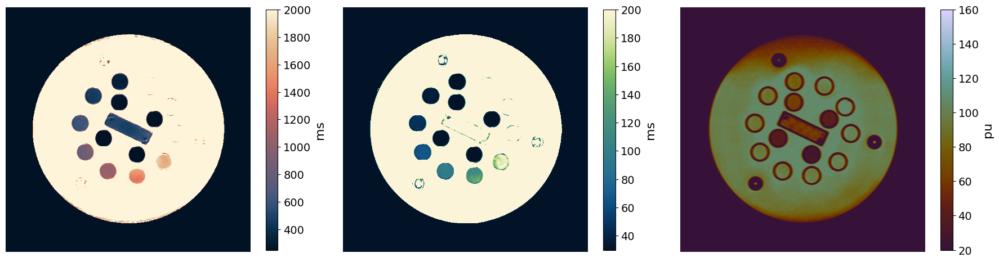

Rep. 2 (MR-Sim)


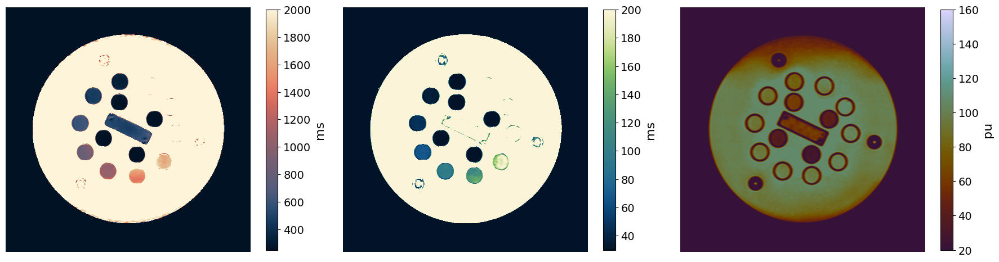

Rep. 1 (MR-Linac, coarse)


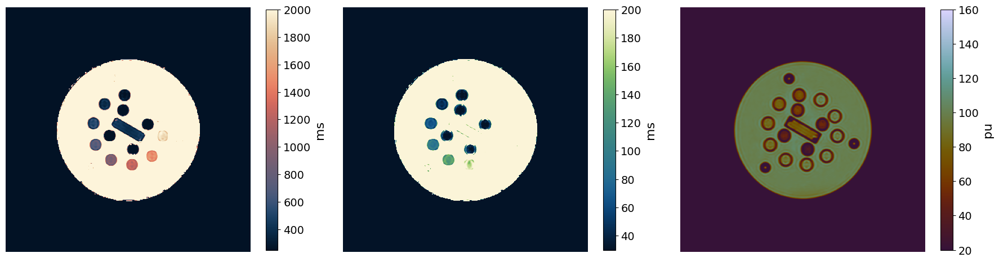

Rep. 2 (MR-Linac, coarse)


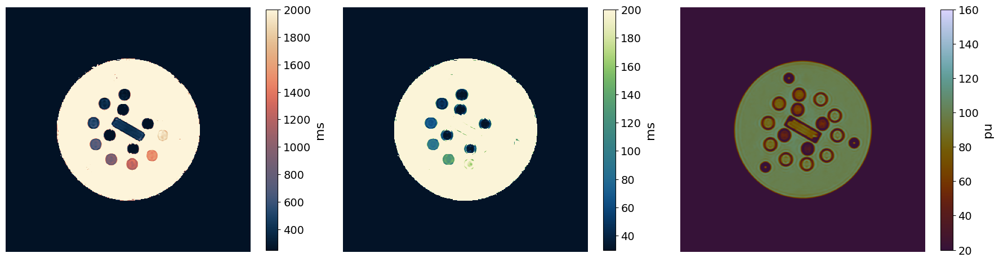

Rep. 1 (MR-Linac, fine)


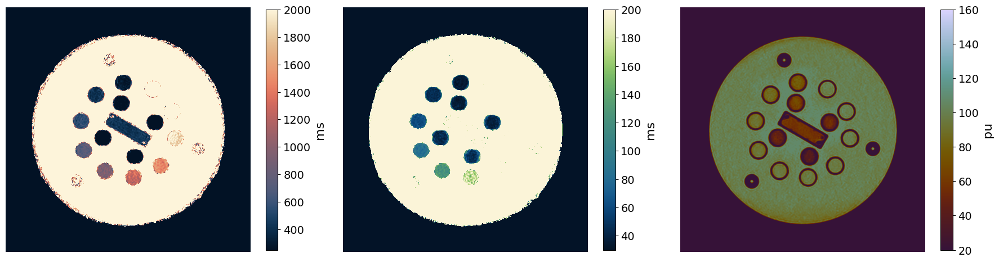

Rep. 2 (MR-Linac, fine)


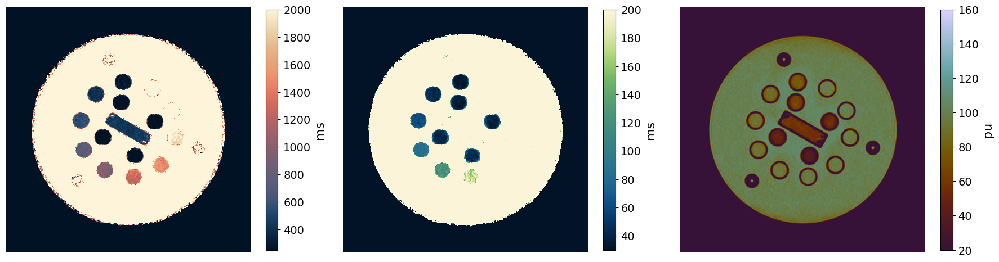

In [5]:
phantom_paths = [
    ('Rep. 1 (MR-Sim)', 'MR-Sim___Phantom-1'),
    ('Rep. 2 (MR-Sim)', 'MR-Sim___Phantom-2'),
    ('Rep. 1 (MR-Linac, coarse)', 'MR-Linac-coarse___Phantom-1'),
    ('Rep. 2 (MR-Linac, coarse)', 'MR-Linac-coarse___Phantom-2'),
    ('Rep. 1 (MR-Linac, fine)', 'MR-Linac-fine___Phantom-1'),
    ('Rep. 2 (MR-Linac, fine)', 'MR-Linac-fine___Phantom-2')
]

all_phantom_data = {}
filtered_all_phantom_data = {}
slice_loc = 15

for sp in phantom_paths:
    print(sp[0])
    all_phantom_data[sp[0]] = {}
    filtered_all_phantom_data[sp[0]] = {}
    symap_path = os.path.join(DATA_PATH, sp[1], 'SYMAPS')
    all_image_files = {
        'T1': [f for f in os.listdir(symap_path) if f.endswith('_T1.dcm')],
        'T2': [f for f in os.listdir(symap_path) if f.endswith('_T2.dcm')],
        'PD': [f for f in os.listdir(symap_path) if f.endswith('_PD.dcm')]
    }

    # Combine all the imaging data into a single array
    for im_type in all_image_files.keys():
        all_phantom_data[sp[0]][im_type] = {
            'all': []
        }
        filtered_all_phantom_data[sp[0]][im_type] = {
            'all': []
        }
        for im_file in all_image_files[im_type]:
            temp_image = pydicom.dcmread(os.path.join(symap_path, im_file))
            temp_image_mat = temp_image.RescaleSlope * temp_image.pixel_array + temp_image.RescaleIntercept
            all_phantom_data[sp[0]][im_type]['all'].append(temp_image_mat)
            filtered_all_phantom_data[sp[0]][im_type]['all'].append(temp_image_mat[~np.isnan(temp_image_mat)])
        temp_all_array = np.array(all_phantom_data[sp[0]][im_type]['all'])
        all_phantom_data[sp[0]][im_type]['all'] = temp_all_array
        filtered_all_phantom_data[sp[0]][im_type]['all'] = temp_all_array[~np.isnan(temp_all_array)]

    fig,axes = plt.subplots(nrows=1, ncols=3, figsize=(18,6))
    for i,im_type in enumerate(['T1','T2','PD']):
        slice_loc = int(all_phantom_data[sp[0]][im_type]['all'].shape[0] / 2)
        sample_image_mat = all_phantom_data[sp[0]][im_type]['all'][slice_loc,:,:]
        # plt.imshow(sample_image_mat, vmin=MIN_RANGE[im_type], vmax=MAX_RANGE[im_type], cmap=CMAPS[im_type])
        temp_im = axes[i].imshow(sample_image_mat, vmin=MIN_RANGE_CLINICAL[im_type], vmax=MAX_RANGE_CLINICAL[im_type], cmap=CMAPS[im_type])
        axes[i].axis('off')
        cbar = plt.colorbar(temp_im, shrink=0.75, ax=axes[i])
        cbar.ax.tick_params(labelsize=14)
        cbar.set_label(label='pu' if im_type=='PD' else 'ms', size=16)
    plt.tight_layout()
    plt.show()


# Visualize the segmentations and extract the values

Rep. 1 (MR-Sim)


C:\Users\lbmccullum\AppData\Local\Temp\ipykernel_20700\4010057881.py:43: RuntimeWarning: Mean of empty slice
  quant_mean = np.nanmean(temp_image_mat[nonzero_struct_mask])
c:\Users\lbmccullum\OneDrive - Inside MD Anderson\Documents\fuller_lab\projects\SyntheticMR_intro_RT\code\published\env38\lib\site-packages\numpy\lib\nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


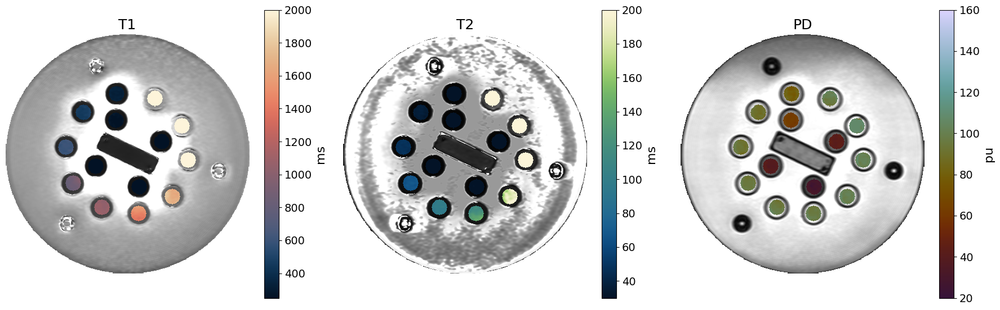

Rep. 2 (MR-Sim)


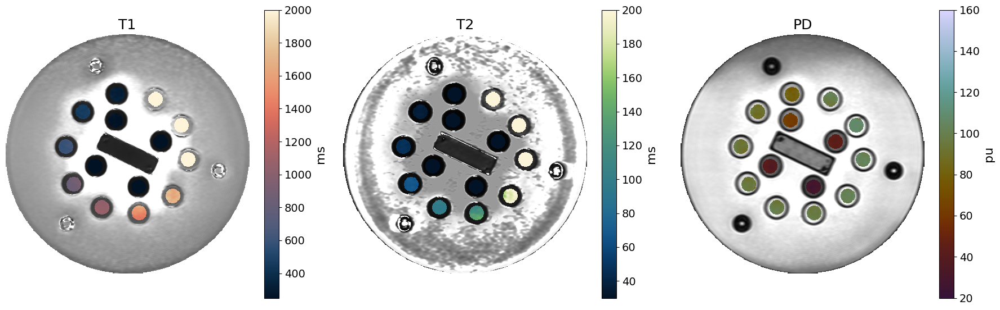

Rep. 1 (MR-Linac, coarse)


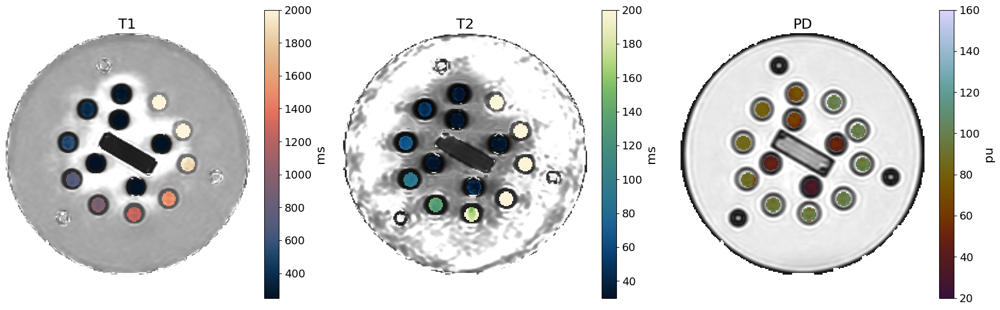

Rep. 2 (MR-Linac, coarse)


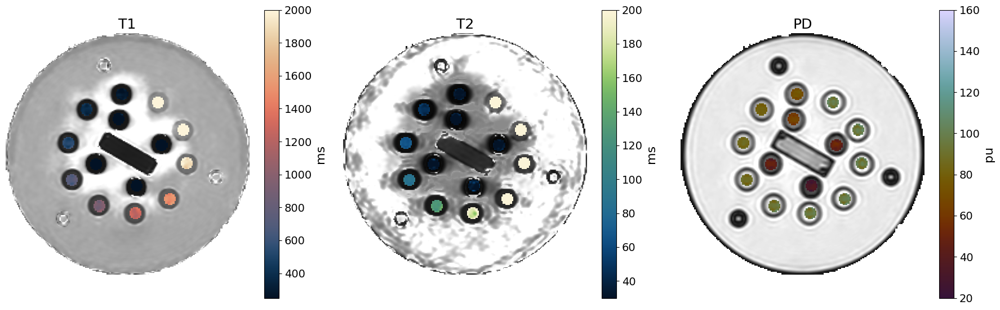

Rep. 1 (MR-Linac, fine)


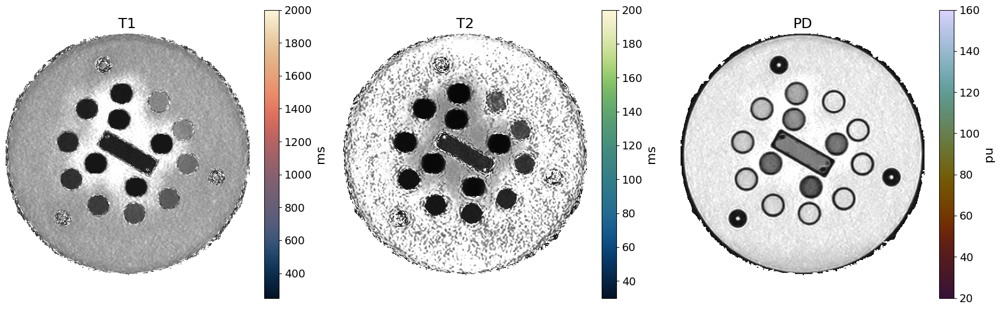

Rep. 2 (MR-Linac, fine)


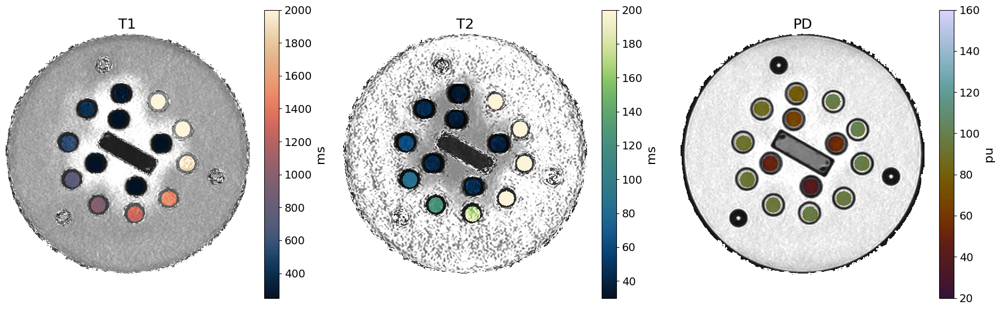

In [6]:
PLOT_VALS = False

for sp in phantom_paths:
    print(sp[0])
    temp_path = os.path.join(DATA_PATH, sp[1], 'rt_structs.seg.nrrd')
    segmentation_info = slicerio.read_segmentation(temp_path)
    struct_mask, _ = nrrd.read(temp_path)
    struct_mask = struct_mask.transpose(1,0,2)
    segment_names = slicerio.segment_names(segmentation_info)
    
    fig,axes = plt.subplots(nrows=1, ncols=3, figsize=(18,6))
    for i,im_type in enumerate(['T1','T2','PD']):
        current_phantom_data = all_phantom_data[sp[0]][im_type]['all'].transpose(1,2,0)
        slice_loc = int(current_phantom_data.shape[2] / 2)
        # Load the SyMap
        temp_image_mat = current_phantom_data[:,:,slice_loc].copy()
        # Set the bounding box to zoom in on the important stuff
        if i==0:
            bounding_box_vals = np.where(temp_image_mat != 0)
            bb_min_x = np.min(bounding_box_vals[0])
            bb_max_x = np.max(bounding_box_vals[0])
            bb_min_y = np.min(bounding_box_vals[1])
            bb_max_y = np.max(bounding_box_vals[1])
        # Plot the underlying anatomy
        temp_image_mat[np.where(temp_image_mat==0)] = np.inf
        axes[i].imshow(temp_image_mat[bb_min_x:bb_max_x, bb_min_y:bb_max_y], vmin=0, vmax=np.percentile(current_phantom_data[current_phantom_data > 0], 97.5), cmap=cm_ref.grayC, alpha=1)
        final_image_mat = np.empty(temp_image_mat.shape, dtype=np.float16)
        final_image_mat[:] = np.nan
        # Show where the segment is
        for segment_name in segment_names:
            nonzero_struct_mask = np.where(struct_mask[:,:,slice_loc] == segment_names.index(segment_name)+1)
            final_image_mat[nonzero_struct_mask] = temp_image_mat[nonzero_struct_mask]
            # Save the extracted segment with spatial information
            saved_image_mat = np.empty(current_phantom_data.shape, dtype=np.float16)
            saved_image_mat[:] = np.nan
            # saved_nonzero_struct_mask = np.where(struct_mask != 0)
            saved_nonzero_struct_mask = np.where(struct_mask == segment_names.index(segment_name)+1)
            saved_image_mat[saved_nonzero_struct_mask] = current_phantom_data[saved_nonzero_struct_mask]
            temp_im = saved_image_mat.copy()
            all_phantom_data[sp[0]][im_type][segment_name] = temp_im
            filtered_all_phantom_data[sp[0]][im_type][segment_name] = temp_im[~np.isnan(temp_im)]
            # Extract the values
            quant_mean = np.nanmean(temp_image_mat[nonzero_struct_mask])
            quant_std = np.nanstd(temp_image_mat[nonzero_struct_mask])
            unit_type = 'pu' if im_type=='PD' else 'ms'
            if PLOT_VALS:
                print(f'{segment_name}, {im_type} ... {quant_mean:.2f} ({quant_std:.2f}) {unit_type}')
        # Plot the results
        # plt.imshow(sample_image_mat, vmin=MIN_RANGE[im_type], vmax=MAX_RANGE[im_type], cmap=CMAPS[im_type])
        temp_im = axes[i].imshow(final_image_mat[bb_min_x:bb_max_x, bb_min_y:bb_max_y], vmin=MIN_RANGE_CLINICAL[im_type], vmax=MAX_RANGE_CLINICAL[im_type], cmap=CMAPS[im_type], alpha=1)
        axes[i].axis('off')
        axes[i].set_title(im_type, fontsize=18)
        cbar = plt.colorbar(temp_im, shrink=0.9, ax=axes[i])
        cbar.ax.tick_params(labelsize=14)
        cbar.set_label(label=unit_type, size=16)

    plt.tight_layout()
    plt.show()

# Define used functions

In [7]:
def LCCC_score(x, y):
    """
    Lin's Concordance Correlation Coefficient

    """
    sxy = np.sum((x - x.mean())*(y - y.mean()))/x.shape[0]
    rhoc = 2*sxy / (np.var(x) + np.var(y) + (x.mean() - y.mean())**2)
    return rhoc

# Plot measured vs. reference

T1, 0.9868127200393823
T2, 0.985275818653061
PD, 0.9948396287205211


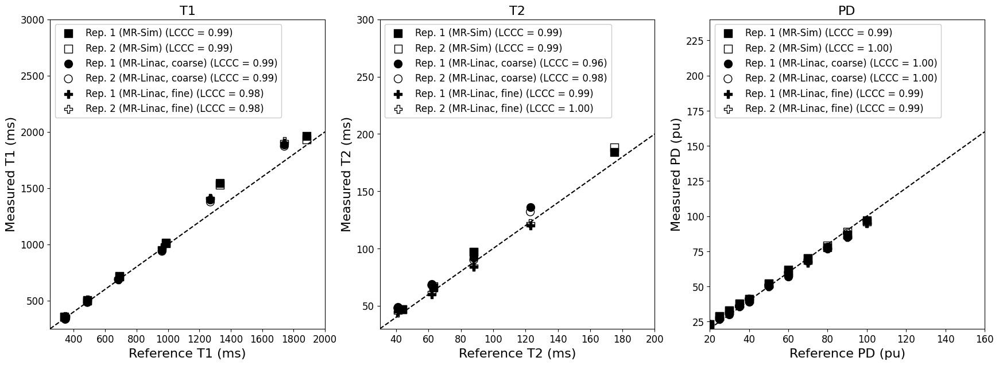

In [8]:
# 3T MR-Sim and 1.5T MR-Linac Repeatability (Final Clinical Sequences)
field_strength = ['3T', '3T', '1.5T', '1.5T', '1.5T', '1.5T']
markers = ['s', 's', 'o', 'o', 'P', 'P']
facecolors = ['k', 'none', 'k', 'none', 'k', 'none']
all_seqs = ['Rep. 1 (MR-Sim)', 'Rep. 2 (MR-Sim)', 'Rep. 1 (MR-Linac, coarse)', 'Rep. 2 (MR-Linac, coarse)', 'Rep. 1 (MR-Linac, fine)', 'Rep. 2 (MR-Linac, fine)']
seq_types = ['T1', 'T2', 'PD']

fig,axes = plt.subplots(nrows=1, ncols=len(seq_types), figsize=(21,7))
for st,seq_type in enumerate(seq_types):
    all_LCCC = []
    axes[st].tick_params(axis='both', which='major', labelsize=12)
    axes[st].tick_params(axis='both', which='minor', labelsize=10)
    axes[st].plot([MIN_RANGE_CLINICAL[seq_type],MAX_RANGE_CLINICAL[seq_type]], [MIN_RANGE_CLINICAL[seq_type],MAX_RANGE_CLINICAL[seq_type]], color='k', linestyle='--')
    for s,seq in enumerate(all_seqs):
        x_vals = np.array(REFERENCE_VALS[seq_type][f'{field_strength[s]}_manual_updated'])[RANGES_CLINICAL[seq_type][f'{field_strength[s]}_manual_updated']].astype(np.int16)
        if seq_type == 'T1':
            min_ind = 1
        elif seq_type == 'T2':
            min_ind = 15
        elif seq_type == 'PD':
            min_ind = 29
        y_vals = np.array([np.mean(filtered_all_phantom_data[seq][seq_type][f'Segment_{s}']) for s in range(min_ind,min_ind+14)])
        # NOTE: The PD vials are reversed to keep increasing order
        y_vals = y_vals[::-1] if seq_type == 'PD' else y_vals
        y_vals = np.array(y_vals[RANGES_CLINICAL[seq_type][f'{field_strength[s]}_manual_updated']]).astype(np.int16)
        lccc = LCCC_score(x_vals, y_vals)
        all_LCCC.append(lccc)
        mean_bias = np.mean(100 * (y_vals - x_vals) / x_vals)
        temp_label = seq
        axes[st].scatter(x_vals, y_vals, color='k', marker=markers[s], facecolor=facecolors[s], s=100, label=f'{temp_label} (LCCC = {lccc:.2f})')
    print(f'{seq_type}, {np.mean(all_LCCC)}')
    legend = axes[st].legend(fontsize=12, loc='upper left')
    legend.get_frame().set_alpha(None)
    axes[st].set_xlim([MIN_RANGE_CLINICAL[seq_type],MAX_RANGE_CLINICAL[seq_type]])
    axes[st].set_ylim([MIN_RANGE_CLINICAL[seq_type],1.5*MAX_RANGE_CLINICAL[seq_type]])
    axes[st].set_xlabel(f'Reference {seq_type} ({UNIT_TYPES[seq_type]})', fontsize=16)
    axes[st].set_ylabel(f'Measured {seq_type} ({UNIT_TYPES[seq_type]})', fontsize=16)
    axes[st].set_title(seq_type, fontsize=16)
plt.show()


# Bland-Altman Plot

T1 / Rep. 1 (MR-Sim): 0.43 (p = 0.3965)
T1 / Rep. 2 (MR-Sim): -0.31 (p = 0.5441)
T1 / Rep. 1 (MR-Linac, coarse): 0.77 (p = 0.0724)
T1 / Rep. 2 (MR-Linac, coarse): 0.77 (p = 0.0724)
T1 / Rep. 1 (MR-Linac, fine): 0.43 (p = 0.3965)
T1 / Rep. 2 (MR-Linac, fine): 0.43 (p = 0.3965)
T2 / Rep. 1 (MR-Sim): -0.40 (p = 0.6000)
T2 / Rep. 2 (MR-Sim): 0.60 (p = 0.4000)
T2 / Rep. 1 (MR-Linac, coarse): -0.80 (p = 0.2000)
T2 / Rep. 2 (MR-Linac, coarse): -0.80 (p = 0.2000)
T2 / Rep. 1 (MR-Linac, fine): -0.80 (p = 0.2000)
T2 / Rep. 2 (MR-Linac, fine): -0.80 (p = 0.2000)
PD / Rep. 1 (MR-Sim): -0.97 (p = 0.0000)
PD / Rep. 2 (MR-Sim): -0.97 (p = 0.0000)
PD / Rep. 1 (MR-Linac, coarse): -0.88 (p = 0.0003)
PD / Rep. 2 (MR-Linac, coarse): -0.98 (p = 0.0000)
PD / Rep. 1 (MR-Linac, fine): -0.98 (p = 0.0000)
PD / Rep. 2 (MR-Linac, fine): -0.97 (p = 0.0000)


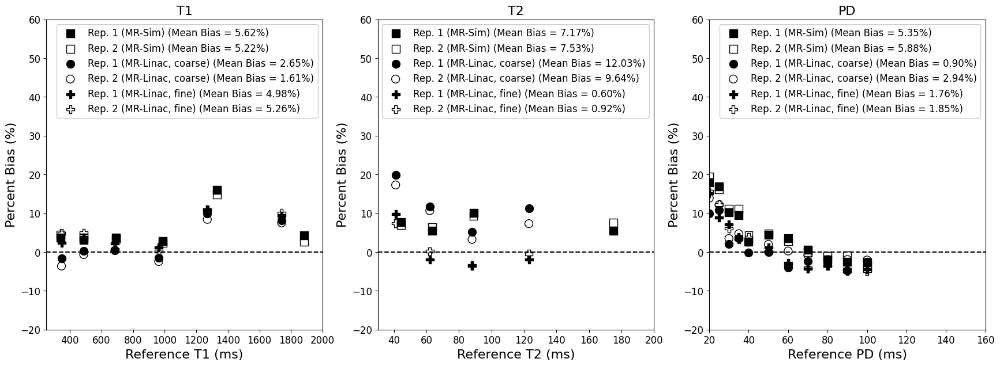

In [9]:
# 3T MR-Sim and 1.5T MR-Linac Repeatability (Final Clinical Sequences)
field_strength = ['3T', '3T', '1.5T', '1.5T', '1.5T', '1.5T']
markers = ['s', 's', 'o', 'o', 'P', 'P']
facecolors = ['k', 'none', 'k', 'none', 'k', 'none']
all_seqs = ['Rep. 1 (MR-Sim)', 'Rep. 2 (MR-Sim)', 'Rep. 1 (MR-Linac, coarse)', 'Rep. 2 (MR-Linac, coarse)', 'Rep. 1 (MR-Linac, fine)', 'Rep. 2 (MR-Linac, fine)']
seq_types = ['T1', 'T2', 'PD']

fig,axes = plt.subplots(nrows=1, ncols=len(seq_types), figsize=(21,7))
for st,seq_type in enumerate(seq_types):
    axes[st].tick_params(axis='both', which='major', labelsize=12)
    axes[st].tick_params(axis='both', which='minor', labelsize=10)
    axes[st].plot([MIN_RANGE_CLINICAL[seq_type],1.25*MAX_RANGE_CLINICAL[seq_type]], [0,0], color='k', linestyle='--')
    for s,seq in enumerate(all_seqs):
        x_vals = np.array(REFERENCE_VALS[seq_type][f'{field_strength[s]}_manual_updated'])[RANGES_CLINICAL[seq_type][f'{field_strength[s]}_manual_updated']]
        if seq_type == 'T1':
            min_ind = 1
        elif seq_type == 'T2':
            min_ind = 15
        elif seq_type == 'PD':
            min_ind = 29
        y_vals = np.array([np.mean(filtered_all_phantom_data[seq][seq_type][f'Segment_{s}']) for s in range(min_ind,min_ind+14)])
        # NOTE: The PD vials are reversed to keep increasing order
        y_vals = y_vals[::-1] if seq_type == 'PD' else y_vals
        y_vals = y_vals[RANGES_CLINICAL[seq_type][f'{field_strength[s]}_manual_updated']]
        diff = y_vals - x_vals
        y_vals = 100 * (y_vals - x_vals) / x_vals
        mean_bias = np.mean(y_vals)
        spearman_rb, spearman_pb = stats.spearmanr(x_vals, y_vals)
        print(f'{seq_type} / {seq}: {spearman_rb:.2f} (p = {spearman_pb:.4f})')
        axes[st].scatter(x_vals, y_vals, color='k', marker=markers[s], facecolor=facecolors[s], s=100, label=f'{seq} (Mean Bias = {mean_bias:.2f}%)')
    legend = axes[st].legend(fontsize=12, loc='upper right')
    legend.get_frame().set_alpha(None)
    axes[st].set_xlim([MIN_RANGE_CLINICAL[seq_type],MAX_RANGE_CLINICAL[seq_type]])
    axes[st].set_ylim([-20,60])
    axes[st].set_xlabel(f'Reference {seq_type} (ms)', fontsize=16)
    axes[st].set_ylabel('Percent Bias (%)', fontsize=16)
    axes[st].set_title(seq_type, fontsize=16)
plt.show()


# Read in the SyntheticMR in-vivo images

Volunteer 1 (MRsim)


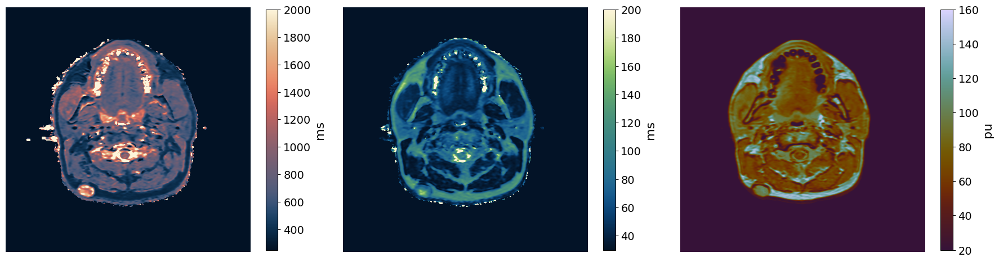

Volunteer 2 (MRsim)


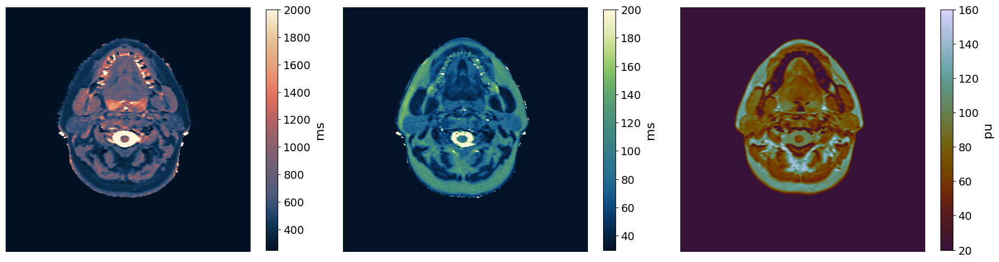

Volunteer 1 (MRL, 1mm)


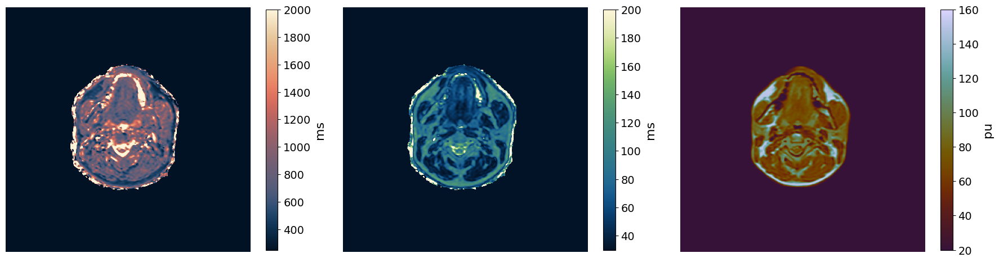

Volunteer 1 (MRL, 0.5mm)


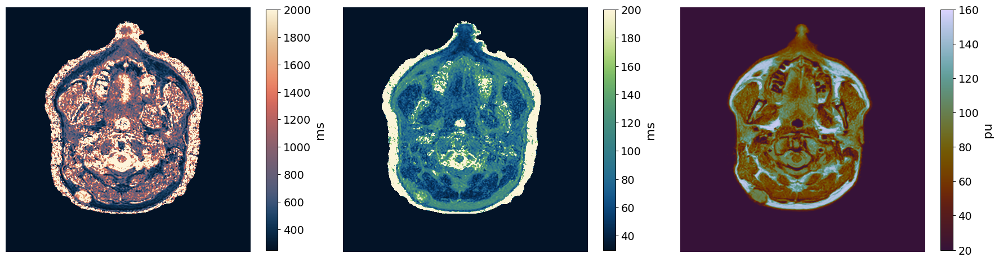

Patient (MRsim)


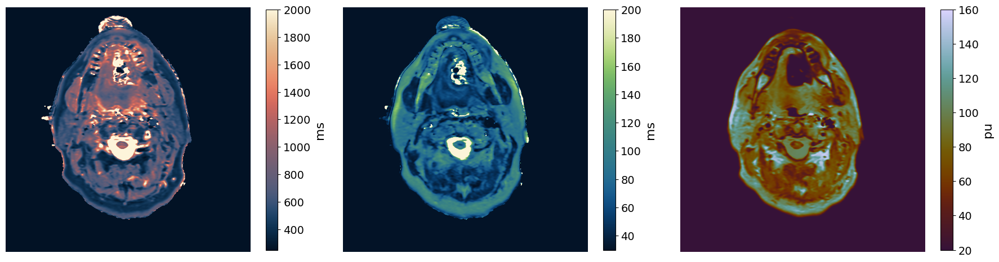

In [10]:
subject_paths = [
    ('Volunteer 1 (MRsim)', 'MR-Sim___Vol-1'),
    ('Volunteer 2 (MRsim)', 'MR-Sim___Vol-2'),
    ('Volunteer 1 (MRL, 1mm)', 'MR-Linac-coarse___Vol-1'),
    ('Volunteer 1 (MRL, 0.5mm)', 'MR-Linac-fine___Vol-1'),
    ('Patient (MRsim)', 'MR-Sim___Patient')
]

all_image_data = {}
filtered_all_image_data = {}
for sp in subject_paths:
    print(sp[0])
    all_image_data[sp[0]] = {}
    filtered_all_image_data[sp[0]] = {}
    symap_path = os.path.join(DATA_PATH, sp[1], 'SYMAPS')
    slice_loc = 15
    all_image_files = {
        'T1': [f for f in os.listdir(symap_path) if f.endswith('_T1.dcm')],
        'T2': [f for f in os.listdir(symap_path) if f.endswith('_T2.dcm')],
        'PD': [f for f in os.listdir(symap_path) if f.endswith('_PD.dcm')]
    }

    # Combine all the imaging data into a single array
    for im_type in all_image_files.keys():
        all_image_data[sp[0]][im_type] = {
            'all': []
        }
        filtered_all_image_data[sp[0]][im_type] = {
            'all': []
        }
        for im_file in all_image_files[im_type]:
            temp_image = pydicom.dcmread(os.path.join(symap_path, im_file))
            temp_image_mat = temp_image.RescaleSlope * temp_image.pixel_array + temp_image.RescaleIntercept
            all_image_data[sp[0]][im_type]['all'].append(temp_image_mat)
            filtered_all_image_data[sp[0]][im_type]['all'].append(temp_image_mat[~np.isnan(temp_image_mat)])
        temp_all_array = np.array(all_image_data[sp[0]][im_type]['all'])
        all_image_data[sp[0]][im_type]['all'] = temp_all_array
        filtered_all_image_data[sp[0]][im_type]['all'] = temp_all_array[~np.isnan(temp_all_array)]

    fig,axes = plt.subplots(nrows=1, ncols=3, figsize=(18,6))
    for i,im_type in enumerate(['T1','T2','PD']):
        sample_image_mat = all_image_data[sp[0]][im_type]['all'][slice_loc,:,:]
        temp_im = axes[i].imshow(sample_image_mat, vmin=MIN_RANGE_CLINICAL[im_type], vmax=MAX_RANGE_CLINICAL[im_type], cmap=CMAPS[im_type])
        axes[i].axis('off')
        cbar = plt.colorbar(temp_im, shrink=0.75, ax=axes[i])
        cbar.ax.tick_params(labelsize=14)
        cbar.set_label(label='pu' if im_type=='PD' else 'ms', size=16)
    plt.tight_layout()
    plt.show()


# Visualize the RTSTRUCTs and extract the values

Volunteer 1 (MRsim)


C:\Users\lbmccullum\AppData\Local\Temp\ipykernel_20700\3719645252.py:59: RuntimeWarning: Mean of empty slice
  quant_mean = np.nanmean(temp_image_mat[nonzero_struct_mask])


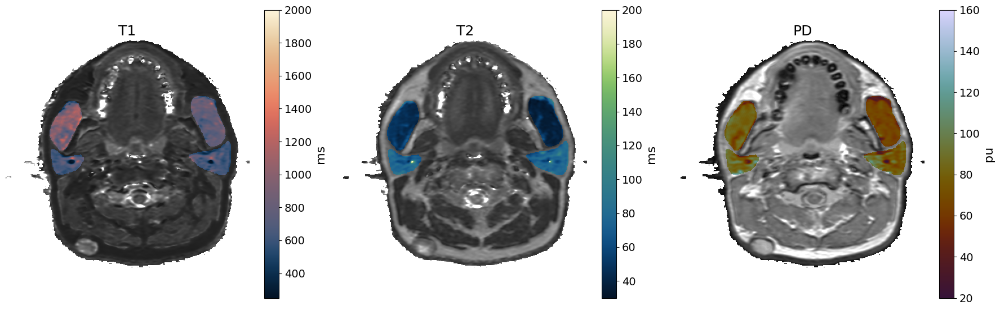

Volunteer 2 (MRsim)


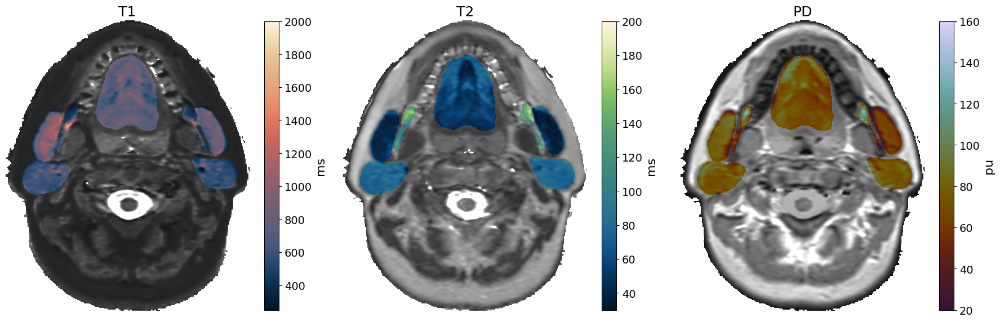

Volunteer 1 (MRL, 1mm)


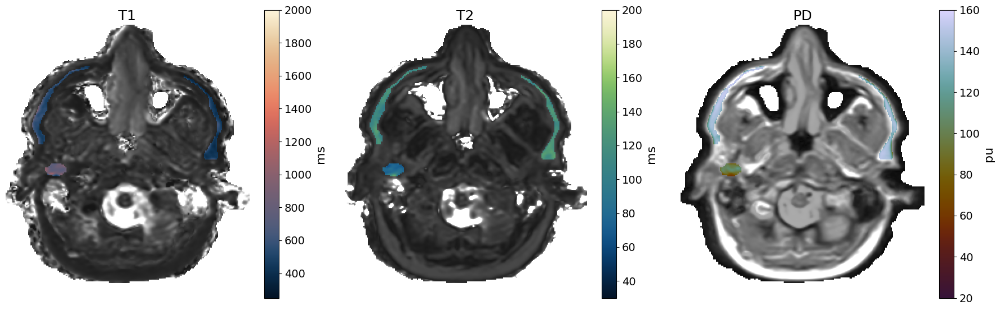

Volunteer 1 (MRL, 0.5mm)


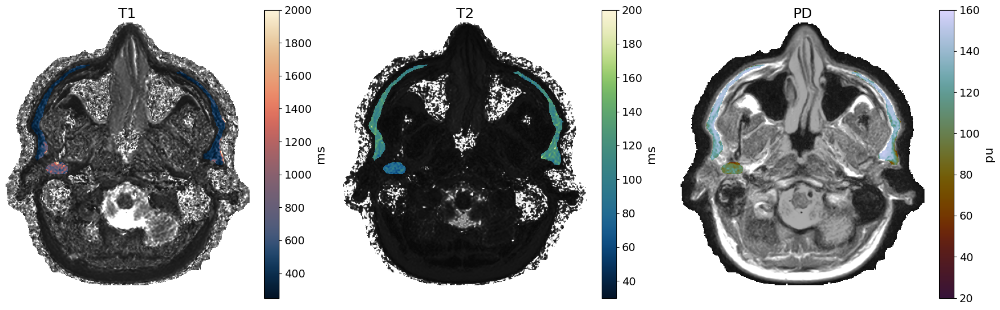

Patient (MRsim)


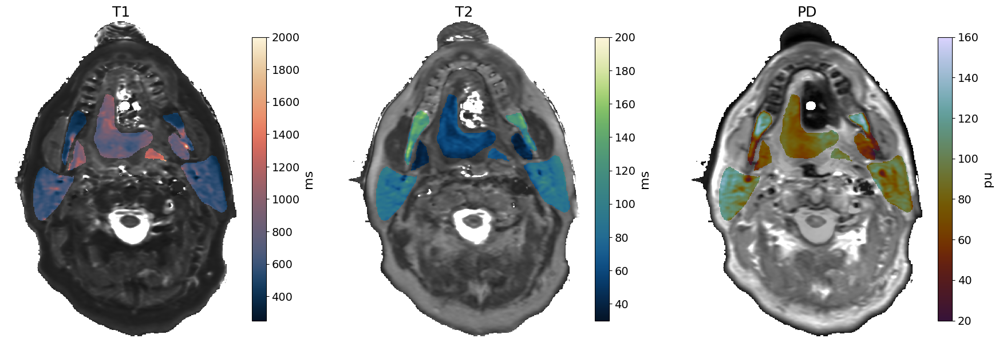

In [11]:
SHOW_OUTPUT = False
desired_structs = [
    'Glnd_Submand_L',
    'Glnd_Submand_R',
    'GTV',
    'Infraorbital_Lymph_L',
    'Infraorbital_Lymph_R',
    'Mandible',
    'Masseter_Muscle_L',
    'Masseter_Muscle_R',
    'Parotid_L',
    'Parotid_R',
    'Pterygoid_Med_L',
    'Pterygoid_Med_R',
    'Tongue',
]

for sp in subject_paths:
    print(sp[0])
    rtstruct_path = os.path.join(DATA_PATH, sp[1])
    temp_path = os.path.join(rtstruct_path, 'rt_structs.seg.nrrd')
    segmentation_info = slicerio.read_segmentation(temp_path)
    struct_mask, _ = nrrd.read(temp_path)
    struct_mask = struct_mask.transpose(1,0,2)
    segment_names = slicerio.segment_names(segmentation_info)
    
    fig,axes = plt.subplots(nrows=1, ncols=3, figsize=(18,6))
    for i,im_type in enumerate(['T1','T2','PD']):
        current_image_data = all_image_data[sp[0]][im_type]['all'].transpose(1,2,0)
        # Load the SyMap
        slice_loc = int(current_image_data.shape[2] / 2)
        temp_image_mat = current_image_data[:,:,slice_loc].copy()
        # Set the bounding box to zoom in on the important stuff
        if i==0:
            bounding_box_vals = np.where(temp_image_mat != 0)
            bb_min_x = np.min(bounding_box_vals[0])
            bb_max_x = np.max(bounding_box_vals[0])
            bb_min_y = np.min(bounding_box_vals[1])
            bb_max_y = np.max(bounding_box_vals[1])
        # Plot the underlying anatomy
        temp_image_mat[np.where(temp_image_mat==0)] = np.inf
        axes[i].imshow(temp_image_mat[bb_min_x:bb_max_x, bb_min_y:bb_max_y], vmin=0, vmax=np.percentile(current_image_data[current_image_data > 0], 97.5), cmap=cm_ref.grayC, alpha=1)
        final_image_mat = np.empty(temp_image_mat.shape)
        final_image_mat[:] = np.nan
        # Show where the RTSTRUCT is
        for ds in desired_structs:
            try:
                nonzero_struct_mask = np.where(struct_mask[:,:,slice_loc] == segment_names.index(ds)+1)
                final_image_mat[nonzero_struct_mask] = temp_image_mat[nonzero_struct_mask]
                # Save the extracted segment with spatial information
                saved_image_mat = np.empty(current_image_data.shape)
                saved_image_mat[:] = np.nan
                saved_nonzero_struct_mask = np.where(struct_mask == segment_names.index(ds)+1)
                saved_image_mat[saved_nonzero_struct_mask] = current_image_data[saved_nonzero_struct_mask]
                temp_im = saved_image_mat.copy()
                all_image_data[sp[0]][im_type][ds] = temp_im
                filtered_all_image_data[sp[0]][im_type][ds] = temp_im[~np.isnan(temp_im)]
                # Extract the values
                quant_mean = np.nanmean(temp_image_mat[nonzero_struct_mask])
                quant_std = np.nanstd(temp_image_mat[nonzero_struct_mask])
                unit_type = UNIT_TYPES[im_type]
                if SHOW_OUTPUT:
                    print(f'{ds}, {im_type} ... {quant_mean:.2f} ({quant_std:.2f}) {unit_type}')
            except ValueError:
                pass
        # Plot the results
        # plt.imshow(sample_image_mat, vmin=MIN_RANGE[im_type], vmax=MAX_RANGE[im_type], cmap=CMAPS[im_type])
        temp_im = axes[i].imshow(final_image_mat[bb_min_x:bb_max_x, bb_min_y:bb_max_y], vmin=MIN_RANGE_CLINICAL[im_type], vmax=MAX_RANGE_CLINICAL[im_type], cmap=CMAPS[im_type], alpha=1)
        axes[i].axis('off')
        axes[i].set_title(im_type, fontsize=18)
        cbar = plt.colorbar(temp_im, shrink=0.9, ax=axes[i])
        cbar.ax.tick_params(labelsize=14)
        cbar.set_label(label=unit_type, size=16)
    plt.tight_layout()
    plt.show()


# Look at all the structures together for each subject

Volunteer 1 (MRsim) ('T1', 'T2')


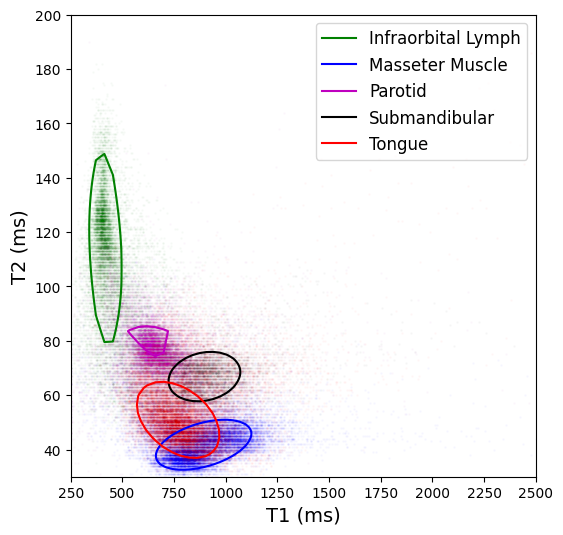

Volunteer 1 (MRsim) ('T1', 'PD')


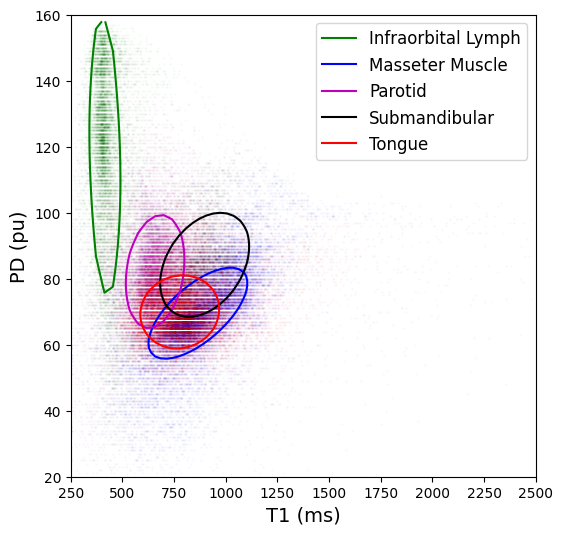

Volunteer 1 (MRsim) ('T2', 'PD')


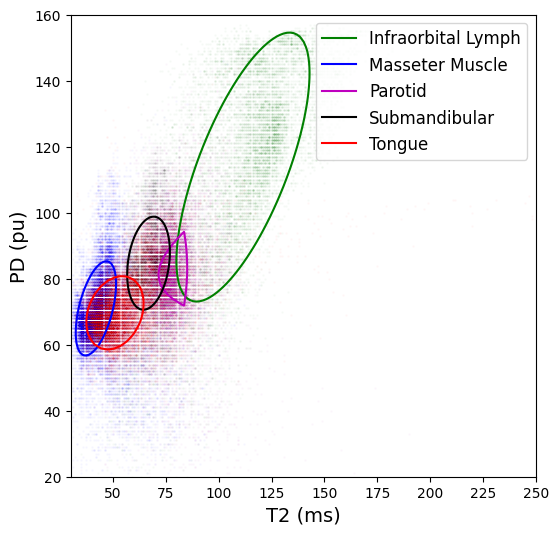

Volunteer 2 (MRsim) ('T1', 'T2')


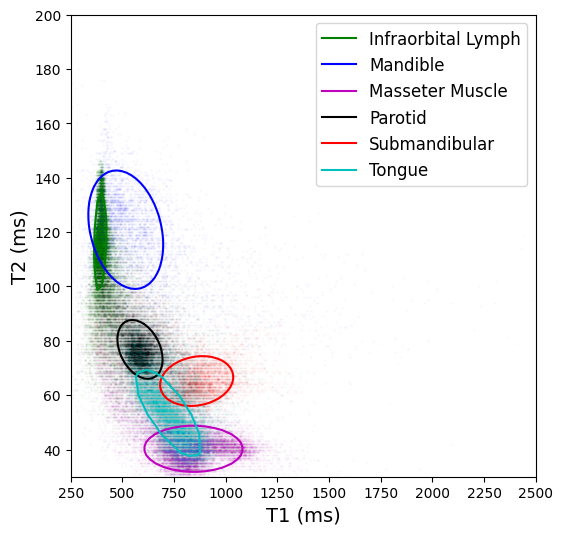

Volunteer 2 (MRsim) ('T1', 'PD')


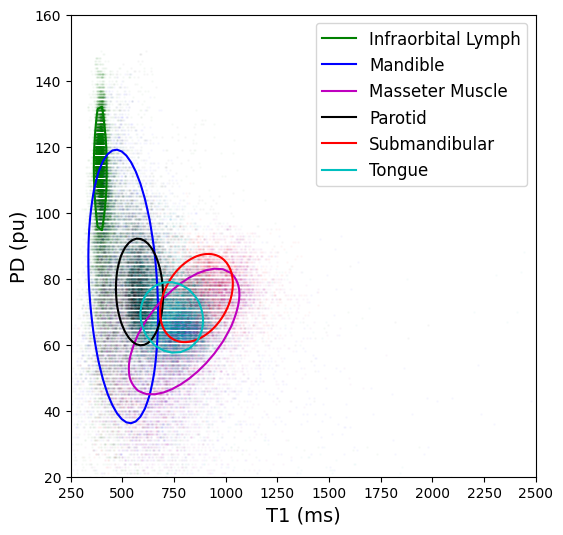

Volunteer 2 (MRsim) ('T2', 'PD')


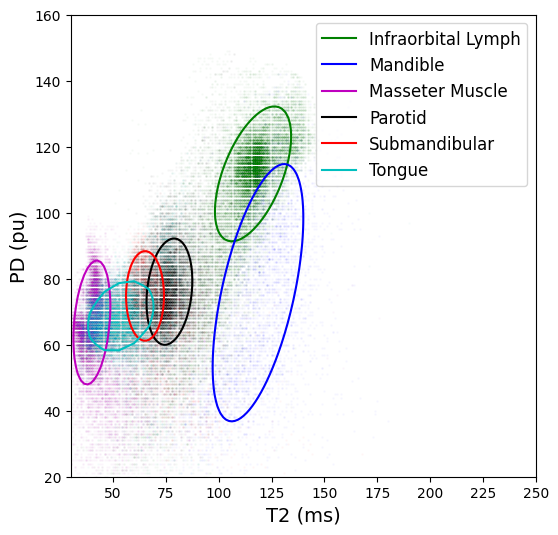

Volunteer 1 (MRL, 1mm) ('T1', 'T2')


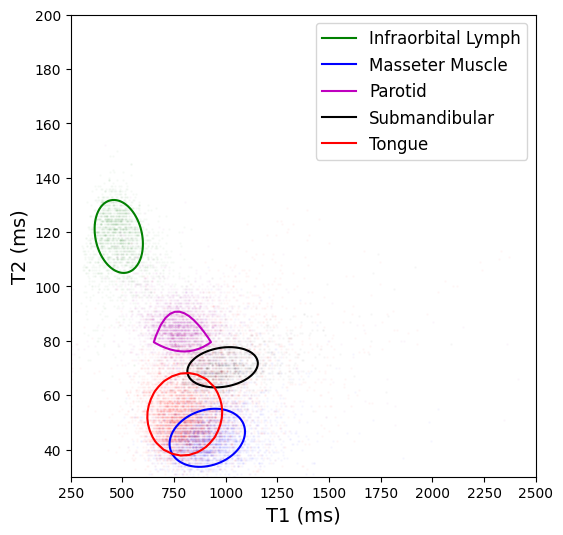

Volunteer 1 (MRL, 1mm) ('T1', 'PD')


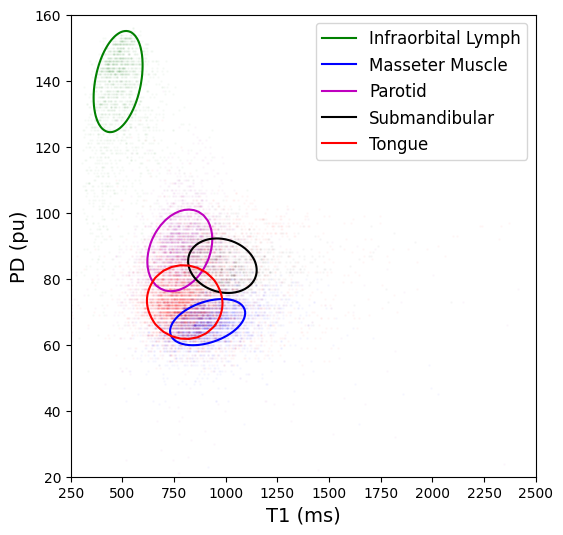

Volunteer 1 (MRL, 1mm) ('T2', 'PD')


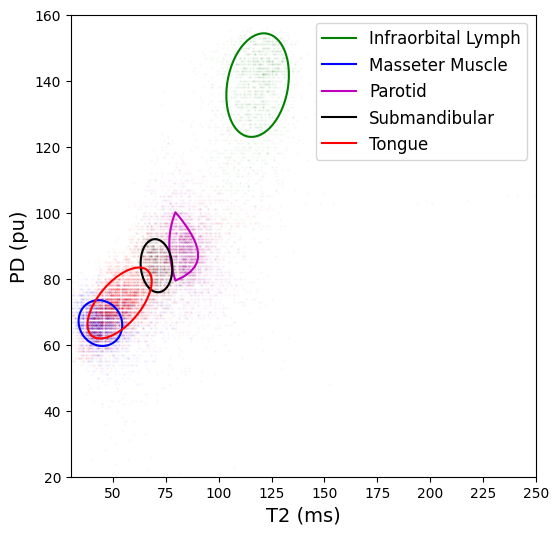

Volunteer 1 (MRL, 0.5mm) ('T1', 'T2')


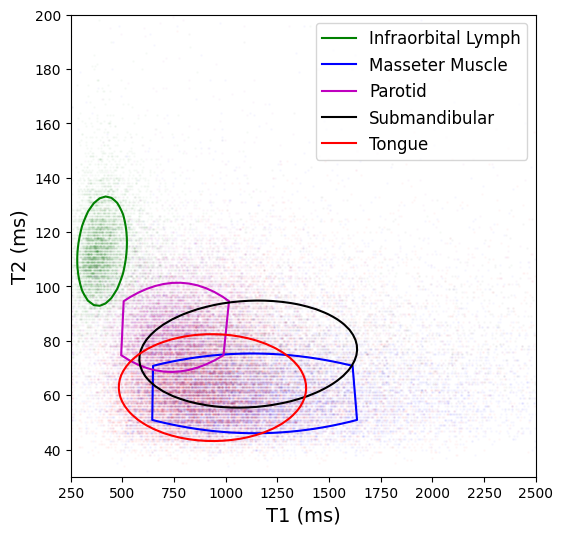

Volunteer 1 (MRL, 0.5mm) ('T1', 'PD')


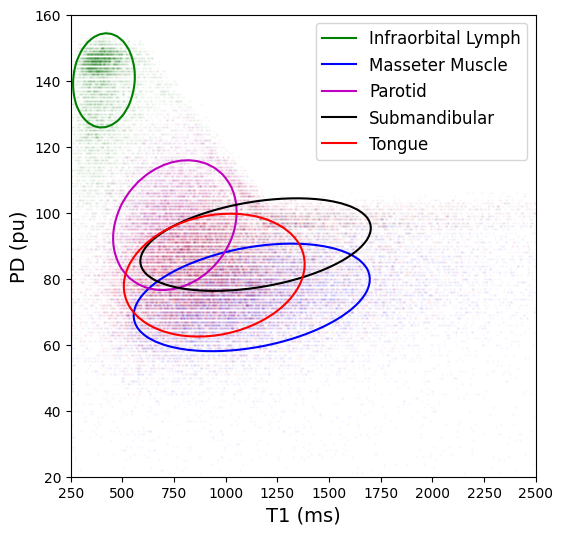

Volunteer 1 (MRL, 0.5mm) ('T2', 'PD')


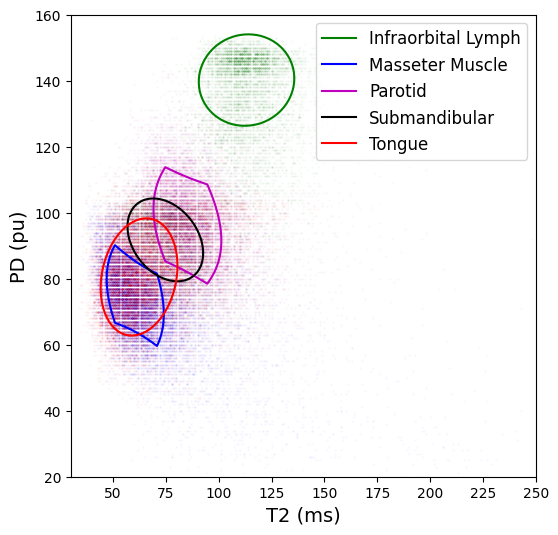

Patient (MRsim) ('T1', 'T2')


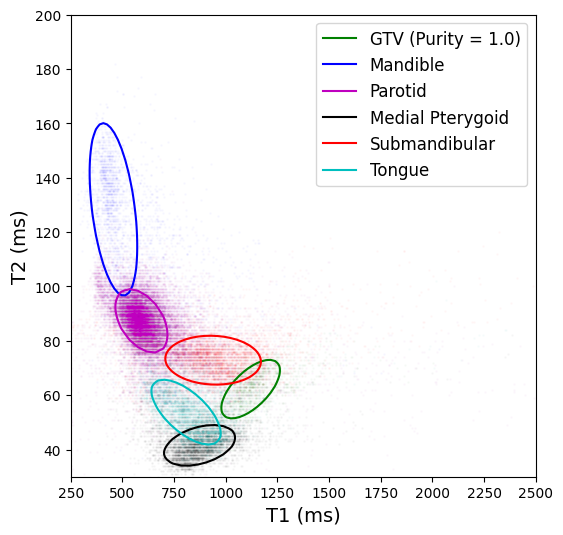

Patient (MRsim) ('T1', 'PD')


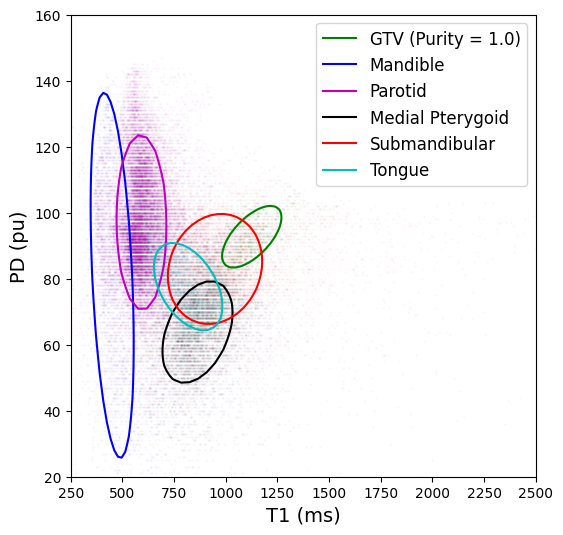

Patient (MRsim) ('T2', 'PD')


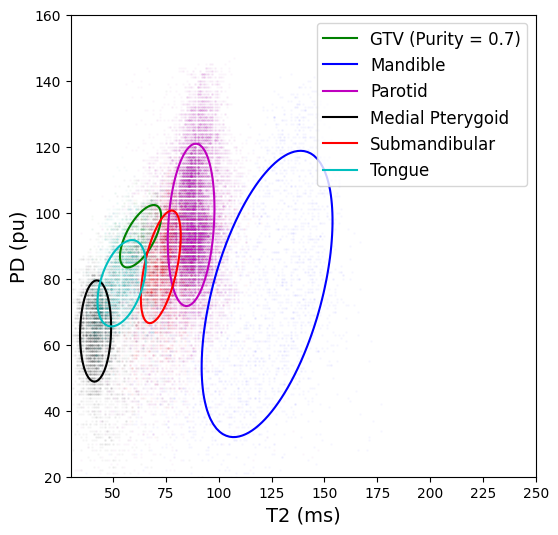

In [12]:
plot_combos = [
    ('T1','T2'),
    ('T1','PD'),
    ('T2','PD')
]
UNIT_TYPES = {
    'T1': 'ms',
    'T2': 'ms',
    'PD': 'pu'
}
colors = ['g', 'b', 'm', 'k', 'r', 'c', 'y']
combined_structs = [
    'Infraorbital_Lymph',
    'GTV',
    'Mandible',
    'Masseter_Muscle',
    'Parotid',
    'Pterygoid_Med',
    'Glnd_Submand',
    'Tongue'
]
struct_labels = (
    'Infraorbital Lymph',
    'GTV',
    'Mandible',
    'Masseter Muscle',
    'Parotid',
    'Medial Pterygoid',
    'Submandibular',
    'Tongue'
)
LR_structs = [
    'Infraorbital_Lymph',
    'Masseter_Muscle',
    'Parotid',
    'Pterygoid_Med',
    'Glnd_Submand'
]

plot_undersample_factor = 2
gamma_undersample_factor = 4
new_dtype = np.int16
all_algorithms = {}
all_purity = [1, 1, 0.7]

for sp in [s[0] for s in subject_paths]:
    all_algorithms[sp] = {}
    for pcc,pc in enumerate(plot_combos):
        all_algorithms[sp][pc] = {}
        color_count = 0
        print(sp, pc)
        plt.figure(figsize=(6,6))
        ax = plt.gca()
        for s,temp_struct in enumerate(combined_structs):
            try:
                if temp_struct in LR_structs:
                    filtered_x = np.concatenate((
                        filtered_all_image_data[sp][pc[0]][f'{temp_struct}_L'].flatten(),
                        filtered_all_image_data[sp][pc[0]][f'{temp_struct}_R'].flatten()
                    )).astype(new_dtype)
                    filtered_y = np.concatenate((
                        filtered_all_image_data[sp][pc[1]][f'{temp_struct}_L'].flatten(),
                        filtered_all_image_data[sp][pc[1]][f'{temp_struct}_R'].flatten()
                    )).astype(new_dtype)
                else:
                    # Doesn't need huge precision, speed it up
                    filtered_x = filtered_all_image_data[sp][pc[0]][temp_struct].flatten().astype(new_dtype)
                    filtered_y = filtered_all_image_data[sp][pc[1]][temp_struct].flatten().astype(new_dtype)

                # Doesn't need huge precision, speed it up
                temp_points = np.vstack((filtered_x, filtered_y)).T.astype(new_dtype)
                # Scatter plot
                plt.scatter(filtered_x[::plot_undersample_factor], filtered_y[::plot_undersample_factor], alpha=0.01*plot_undersample_factor, s=1, c=colors[color_count])
                if temp_struct == 'GTV':
                    plt.plot([], [], c=colors[color_count], label=f'GTV (Purity = {all_purity[pcc]:.1f})')
                else:
                    plt.plot([], [], c=colors[color_count], label=struct_labels[s])
                # Empirical covariance w/ support_fraction, robust covariance (minimum covariance determinant) if not
                algorithm = EllipticEnvelope(contamination=0.4)
                algorithm.fit(temp_points)
                all_algorithms[sp][pc][temp_struct] = algorithm
                DecisionBoundaryDisplay.from_estimator(
                    algorithm,
                    temp_points,
                    response_method='decision_function',
                    plot_method='contour',
                    levels=[0],
                    colors=colors[color_count],
                    ax=ax
                )
                color_count += 1
            except KeyError:
                pass
        plt.xlabel(f'{pc[0]} ({UNIT_TYPES[pc[0]]})', fontsize=14)
        plt.ylabel(f'{pc[1]} ({UNIT_TYPES[pc[1]]})', fontsize=14)
        plt.xlim([MIN_RANGE_CLINICAL[pc[0]], 1.25*MAX_RANGE_CLINICAL[pc[0]]])
        plt.ylim([MIN_RANGE_CLINICAL[pc[1]], MAX_RANGE_CLINICAL[pc[1]]])
        plt.legend(fontsize=12, loc='upper right')
        plt.show()


# Calculate the purity measure for the patient clusters

In [13]:
combined_structs = [
    'Pterygoid_Med',
    'Mandible',
    'Parotid',
    'Tongue',
    'GTV'
]
LR_structs = [
    'Pterygoid_Med',
    'Glnd_Submand',
    'Parotid'
]

plot_undersample_factor = 2
gamma_undersample_factor = 4
new_dtype = np.int16

sigclust_points = {}
for sp in ['Patient (MRsim)']:
    sigclust_points[sp] = {}
    for pc in plot_combos:
        sigclust_points[sp][pc] = {}
        print(sp, pc)
        for s,temp_struct in enumerate(combined_structs):
            if temp_struct in LR_structs:
                filtered_x = np.concatenate((
                    filtered_all_image_data[sp][pc[0]][f'{temp_struct}_L'].flatten(),
                    filtered_all_image_data[sp][pc[0]][f'{temp_struct}_R'].flatten()
                )).astype(new_dtype)
                filtered_y = np.concatenate((
                    filtered_all_image_data[sp][pc[1]][f'{temp_struct}_L'].flatten(),
                    filtered_all_image_data[sp][pc[1]][f'{temp_struct}_R'].flatten()
                )).astype(new_dtype)
            else:
                # Doesn't need huge precision, speed it up
                filtered_x = filtered_all_image_data[sp][pc[0]][temp_struct].flatten().astype(new_dtype)
                filtered_y = filtered_all_image_data[sp][pc[1]][temp_struct].flatten().astype(new_dtype)

            # Doesn't need huge precision, speed it up
            temp_points = np.vstack((filtered_x, filtered_y)).T.astype(new_dtype)
            sigclust_points[sp][pc][temp_struct] = temp_points
            if s == 0:
                all_points = temp_points.copy()
            else:
                all_points = np.vstack((all_points,temp_points))

        # Determine the proportion of GTV points inside contour
        # -1 if outlier, 1 if inlier
        # [
        #     [x1,y1],
        #     [x2,y2],
        #     ...
        #     [xn,yn]
        # ]
        count_inside = 0
        count_outside = 0
        outside_structs = [c for c in combined_structs if c != 'GTV']
        for p in all_points:
            if all_algorithms[sp][pc]['GTV'].predict([p]) == 1:
                count_inside += 1
            temp_count_outside = 0
            for outside_struct in outside_structs:
                if (all_algorithms[sp][pc]['GTV'].predict([p]) == 1) and (all_algorithms[sp][pc][outside_struct].predict([p]) == 1):
                    temp_count_outside += 1
            if temp_count_outside > 0:
                count_outside += 1

        print(count_inside / (count_inside + count_outside), end='\n\n')


Patient (MRsim) ('T1', 'T2')
1.0

Patient (MRsim) ('T1', 'PD')
1.0

Patient (MRsim) ('T2', 'PD')
0.7004639972503867



# Calculate the statistical significance between clusters

In [14]:
struct_1 = 'Tongue'
struct_2 = 'GTV'

for pc in plot_combos:
    all_cluster_points = np.vstack((sigclust_points['Patient (MRsim)'][pc][struct_1], sigclust_points['Patient (MRsim)'][pc][struct_2]))
    sigclust.sigclust(
        all_cluster_points,
        mc_iters=100,
        verbose=False
    )
    print(pc)

Scaling and centering input matrix.
Cluster index of input data: 0.591711
Estimated variance for background noise: 0.957964
Applying soft thresholding...
Simulating 100 cluster indices.  Please wait...
Simulation complete.
The simulated cluster indices had
mean: 0.634895
standard deviation: 0.003334.
In 100 iterations there were
0 cluster indices <= the cluster index 0.591711
of the input data.
p-value:  0.000000
('T1', 'T2')
Scaling and centering input matrix.
Cluster index of input data: 0.556999
Estimated variance for background noise: 0.879801
Applying soft thresholding...
Simulating 100 cluster indices.  Please wait...
Simulation complete.
The simulated cluster indices had
mean: 0.619227
standard deviation: 0.003161.
In 100 iterations there were
0 cluster indices <= the cluster index 0.556999
of the input data.
p-value:  0.000000
('T1', 'PD')
Scaling and centering input matrix.
Cluster index of input data: 0.553033
Estimated variance for background noise: 1.123683
Applying soft th